In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from bin import utils

In [2]:
fdata = sc.read_h5ad('./RNA/B03502E5.clustered.h5')

In [3]:
gdata = sc.read_h5ad('./RNA/B03502E5.combined.bin100.h5')
gdata = gdata[:, gdata.var_names.str.startswith('sg')].copy()

gdata = utils.combine_guide_replicates(gdata)

/home/wpy/stereoseq/20240802-Tumor/bin/utils.py:88: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sgs_grouped = sgs_grouped.groupby(sgs, axis=1).sum()


In [4]:
gdata = gdata[fdata.obs_names, :].copy()

In [5]:
sc.tl.rank_genes_groups(fdata, 'cluster', method='t-test')

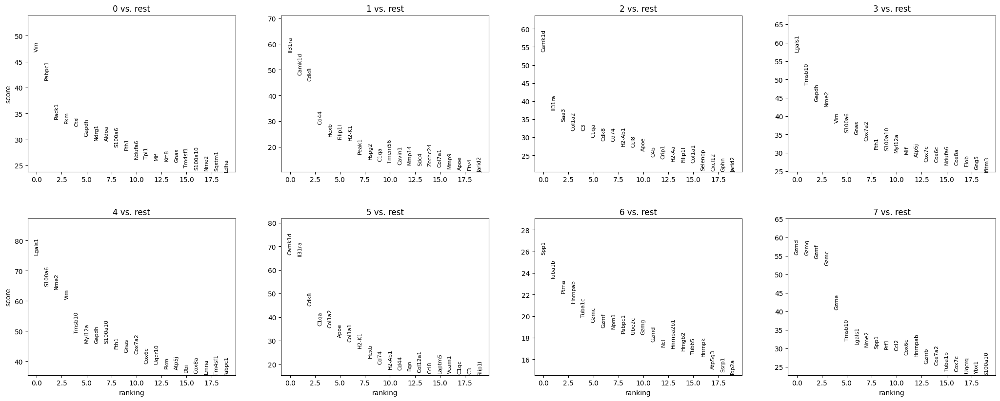

In [6]:
sc.pl.rank_genes_groups(fdata, n_genes=20, sharey=False)
plt.show()

In [7]:
pval_cutoff = 0.05
top_n = 200

result = fdata.uns['rank_genes_groups']
groups = result['names'].dtype.names

top_genes_df = pd.DataFrame()

for group in groups:
    genes = result['names'][group]
    log2fc = result['logfoldchanges'][group]
    padj = result['pvals_adj'][group]
    score = result['scores'][group]
    
    data = pd.DataFrame({
        'Gene': genes,
        'Log2FoldChange': log2fc,
        'padj': padj,
        'score': score,
        'Cluster': group
    })
    
    filtered_data = data[data['padj'] < pval_cutoff]
    up_sorted_data = filtered_data[filtered_data['Log2FoldChange'] > 0].sort_values(by='Log2FoldChange', ascending=False)
    top_genes = up_sorted_data.head(top_n)
    top_genes_df = pd.concat([top_genes_df, top_genes], ignore_index=True)

degs = top_genes_df["Gene"].unique().tolist()
top_genes_df.to_csv('../20240502-SPACseq/DEG.csv', index=False, sep="\t")
top_genes_df

,Gene,Log2FoldChange,padj,score,Cluster
0,Pira2,3.109035,4.298188e-02,2.420046,0
1,Reep1,2.554196,3.404875e-02,2.515788,0
2,Etos1,2.272333,3.314411e-02,2.527261,0
3,Alkal1,2.167539,1.236211e-02,2.912443,0
4,Gp5,2.025798,4.639363e-02,2.387165,0
...,...,...,...,...,...
1595,Ndufb2,0.963378,1.497504e-39,14.027220,7
1596,Cdk1,0.955880,3.103449e-27,11.499590,7
1597,Lsm5,0.953971,4.287967e-15,8.411063,7
1598,Olfr66,0.953926,1.042867e-02,3.088552,7


In [9]:
# # perform GSVA analysis using gseapy with top DEGs
# import gseapy as gp
# from tqdm import tqdm

# go_results = pd.DataFrame()
# for cluster in tqdm(top_genes_df['Cluster'].unique()):
#     degs_up = top_genes_df[(top_genes_df['Log2FoldChange'] > 0) & (top_genes_df['Cluster'] == cluster)]

#     enr_up = gp.enrichr(gene_list=degs_up['Gene'].tolist(), gene_sets='GO_Biological_Process_2021', outdir='./enrichr')
#     enr_up.res2d.Term = enr_up.res2d.Term.str.split(" \(GO").str[0]
#     enr_up.res2d['Cluster'] = cluster
#     go_results = pd.concat([go_results, enr_up.res2d], ignore_index=True)

!sshpass -p wang2024 ssh wpy@172.16.10.103 "mamba run -n gsea python ~/stereoseq/20240502-SPACseq/enrich.py"

Gene               object
Log2FoldChange    float64
padj              float64
score             float64
Cluster             int64
dtype: object
/home/wpy/stereoseq/20240502-SPACseq/bin/go-basic.obo: fmt(1.2) rel(2024-04-24) 45,667 Terms
Enrichment analysis for list 0 completed successfully: 1996
Enrichment analysis for list 1 completed successfully: 2320
Enrichment analysis for list 2 completed successfully: 1645
Enrichment analysis for list 3 completed successfully: 1478
Enrichment analysis for list 4 completed successfully: 1759
Enrichment analysis for list 5 completed successfully: 1970
Enrichment analysis for list 6 completed successfully: 1656
Enrichment analysis for list 7 completed successfully: 1883



In [8]:
for i in range(8):
    enr = pd.read_csv(f"../20240502-SPACseq/GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False)
    results = results[results["Adjusted P-value"] < 0.1]
    results = results.loc[:, ["Term", "Genes", "Adjusted P-value"]]
    results["Cluster"] = i
    results["Gene Counts"] = results["Genes"].str.split(";").apply(len)
    results = results[~results["Term"].str.contains('R-HSA', case=False)]

    # results["Term"] = results["Term"].str.split("R-HSA").str[0]
    results["Term"] = results["Term"].str.split(" \(GO").str[0]

    results = results[~results["Term"].str.contains('disease', case=False)]
    results = results[~results["Term"].str.contains('cycle', case=False)]

    results = results.groupby("Cluster", as_index=False).apply(lambda x: x.sort_values(by='Adjusted P-value')).reset_index(drop=True)
    if not i: go_df = results
    else: go_df = pd.concat([go_df, results], axis=0)
# go_df.to_csv('./GO/Reactome.csv', index=None, sep='\t')
go_df

<>:11: SyntaxWarning: invalid escape sequence '\('
<>:11: SyntaxWarning: invalid escape sequence '\('
/tmp/ipykernel_27844/4106658108.py:11: SyntaxWarning: invalid escape sequence '\('
  results["Term"] = results["Term"].str.split(" \(GO").str[0]
/tmp/ipykernel_27844/4106658108.py:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  results = results.groupby("Cluster", as_index=False).apply(lambda x: x.sort_values(by='Adjusted P-value')).reset_index(drop=True)
/tmp/ipykernel_27844/4106658108.py:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either

,Term,Genes,Adjusted P-value,Cluster,Gene Counts
0,HIF-1 signaling pathway,EGLN3;SERPINE1;EIF4EBP1;PGK1;SLC2A1;ENO1;GAPDH...,0.000180,0,9
1,MAPK signaling pathway,DUSP4;GADD45A;HSPB1;HSPA2;DUSP8;AREG;PGF;CACNA...,0.000778,0,13
2,Cellular Response To Hypoxia,EGLN3;FAM162A;BNIP3;PGK1;AQP3;NDRG1;VEGFA,0.003853,0,7
3,Regulation Of Angiogenesis,GPNMB;YJEFN3;SERPINE1;PGK1;HSPB1;KLF4;TSPAN12;...,0.003853,0,11
4,Cellular Response To Decreased Oxygen Levels,EGLN3;FAM162A;BNIP3;PGK1;AQP3;NDRG1;VEGFA,0.003853,0,7
...,...,...,...,...,...
29,Positive Regulation Of Hydrolase Activity,RGS1;CCL20;RGS16;CCL3;CCL2;THY1;RGS8,0.081143,7,7
30,Interleukin-2-Mediated Signaling Pathway,IL2RA;IL2RB,0.081143,7,2
31,"Positive Regulation Of CD8-positive, Alpha-Bet...",PTPN22;RUNX3,0.097404,7,2
32,Sequestering Of Actin Monomers,SCIN;TMSB15A,0.097404,7,2


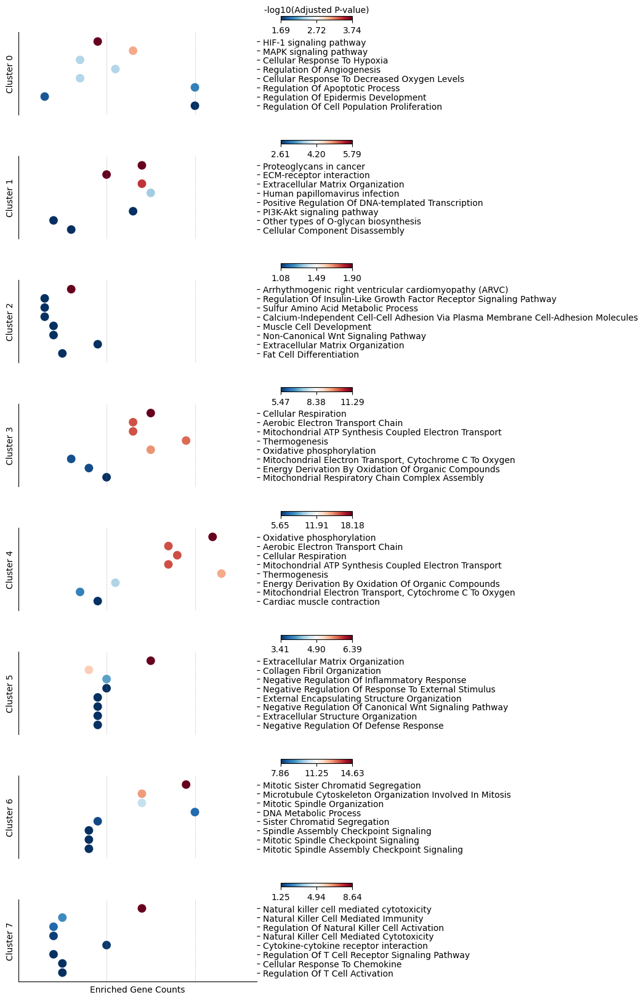

In [58]:
from matplotlib.ticker import FormatStrFormatter
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig, ax = plt.subplots(8, 1, figsize=(5, 20))
for cluster in range(8):
    gsea_results = go_df[go_df["Cluster"] == cluster].sort_values(by='Adjusted P-value', ascending=True)[:8]
    gsea_results['Adjusted P-value'] = -np.log10(gsea_results['Adjusted P-value'])
    # gsea_results['Gene Counts'] = gsea_results['Overlap'].str.split('/').str[0].map(lambda x: int(x))

    barplot = sns.scatterplot(
        x='Gene Counts', 
        y='Term', 
        data=gsea_results,
        hue='Adjusted P-value',
        palette="RdBu_r",
        edgecolor='none',
        ax=ax[cluster],
        legend=False,
        s=100,
    )

    norm = plt.Normalize(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max())
    sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=norm)
    sm.set_array([])
    cax = inset_axes(ax[cluster], width="30%", height="5%", loc='upper right',
                     bbox_to_anchor=(0.4, 0.2, 1, 1), bbox_transform=ax[cluster].transAxes, borderpad=0)
    if cluster == 0:
        cbar = fig.colorbar(sm, cax=cax, label="-log10(Adjusted P-value)", orientation='horizontal', shrink=0.1)
        cbar.ax.xaxis.set_label_position('top')
    else: cbar = fig.colorbar(sm, cax=cax, orientation='horizontal', shrink=0.05)

    cbar_ticks = np.linspace(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max(), num=3)  # Adjust num for density
    cbar.set_ticks(cbar_ticks)
    cbar.ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))

    ax[cluster].yaxis.tick_right()
    ax[cluster].yaxis.set_label_position('right')

    for tick in ax[cluster].get_yticklabels():
        tick.set_fontsize(10)  # 设置yticklabel文字大小为12

    ax[cluster].set_xlabel('')
    ax[cluster].set_ylabel(f'Cluster {cluster}')
    ax[cluster].yaxis.set_label_position('left')
    ax[cluster].set_ylim([-1, 8])
    ax[cluster].set_xlim([0, 27])
    if cluster != 7:
        ax[cluster].set_xticks([])
        sns.despine(left=False, bottom=True, ax=ax[cluster])
    else:
        ax[cluster].set_xticks(np.arange(0, 27, 10))
        sns.despine(left=False, bottom=False, ax=ax[cluster])
    ax[cluster].invert_yaxis()

for cluster in range(8):
    for tick in ax[7].get_xticks():
        ax[cluster].axvline(x=tick, linestyle='--', color='gray', alpha=0.5, linewidth=0.5)
    ax[cluster].sharex(ax[7])

for cluster in range(7):
    ax[cluster].set_xticks([])

plt.subplots_adjust(hspace=0.5)
# ax[0].set_title('GSEA Bar Plot')
ax[7].set_xlabel('Enriched Gene Counts')
plt.rcParams['pdf.fonttype']=42
plt.savefig("./plots/nmf_programs_gsea.pdf", format="pdf", bbox_inches='tight')
plt.show()

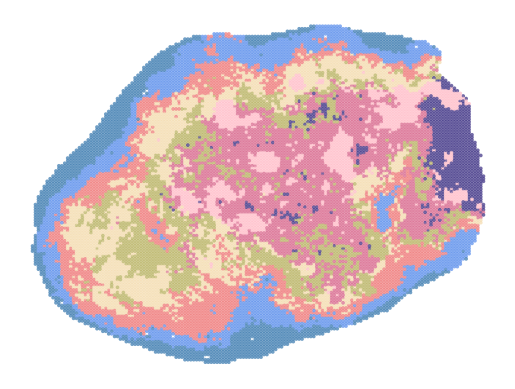

In [48]:
palette = ['darkkhaki', 'lightcoral', 'steelblue', 'darkslateblue', 'palevioletred', 'cornflowerblue', 'wheat', 'pink']
sns.scatterplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                hue=fdata.obs['cluster'], s=7, alpha=0.76, legend=False,
                palette=palette, edgecolor='none', marker='o')
plt.gca().invert_yaxis()
# plt.legend(title='Cluster', loc='upper right', bbox_to_anchor=(1.1, 1), borderaxespad=0., frameon=False)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.show()

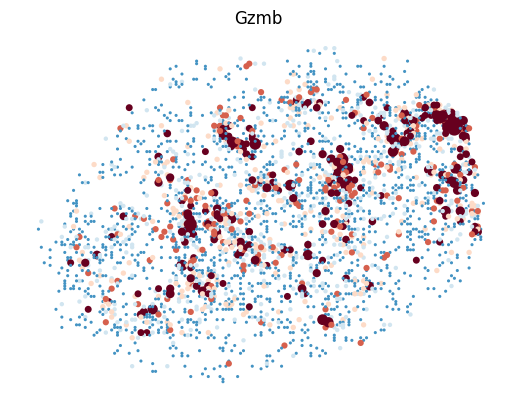

In [10]:
# plt.figure(figsize=(5, 4))
sns.scatterplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                s=fdata[:, 'Gzmb'].layers['counts'].toarray().flatten()*5, c=fdata[:, 'Gzmb'].layers['counts'].toarray().flatten(), alpha=1, legend=False,
                cmap='RdBu_r', edgecolor='none', vmax=5)
plt.gca().invert_yaxis()
plt.title('Gzmb')
# plt.legend(title='Gzmb', loc='upper right', bbox_to_anchor=(1.1, 1), borderaxespad=0., frameon=False)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.show()

In [37]:
fdata.var_names[fdata.var_names.str.startswith('Ifn')]

Index(['Ifnar2', 'Ifng', 'Ifngas1', 'Ifngr1', 'Ifngr2', 'Ifnlr1', 'Ifnz'], dtype='object')

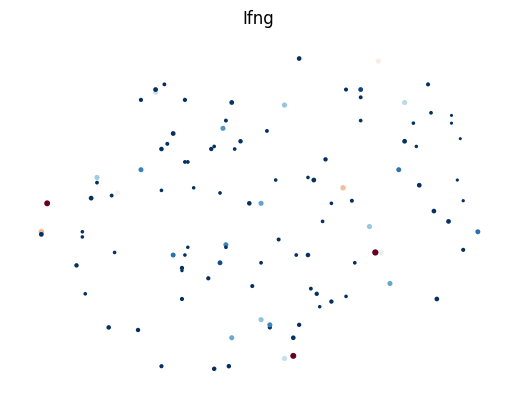

In [45]:
# plt.figure(figsize=(5, 4))
gene = 'Ifng'
sns.scatterplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                # s=(fdata[:, gene].layers['counts'].toarray().flatten()) * 0.5, c=fdata[:, gene].layers['counts'].toarray().flatten(), alpha=1, legend=False,
                s=fdata[:, gene].X.toarray().flatten() * 6, c=fdata[:, gene].X.toarray().flatten(), alpha=1, legend=False,
                cmap='RdBu_r', edgecolor='none', vmax=3, vmin=2)
plt.gca().invert_yaxis()
plt.title(gene)
# plt.legend(title='Gzmb', loc='upper right', bbox_to_anchor=(1.1, 1), borderaxespad=0., frameon=False)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.show()

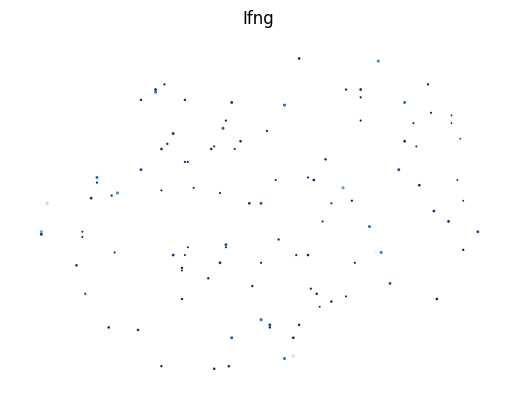

In [36]:
# plt.figure(figsize=(5, 4))
gene = 'Ifng'
sns.scatterplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                # s=(fdata[:, gene].layers['counts'].toarray().flatten()) * 0.5, c=fdata[:, gene].layers['counts'].toarray().flatten(), alpha=1, legend=False,
                s=fdata[:, gene].X.toarray().flatten() * 2, c=fdata[:, gene].X.toarray().flatten(), alpha=1, legend=False,
                cmap='RdBu_r', edgecolor='none', vmax=4.7, vmin=2)
plt.gca().invert_yaxis()
plt.title(gene)
# plt.legend(title='Gzmb', loc='upper right', bbox_to_anchor=(1.1, 1), borderaxespad=0., frameon=False)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.show()

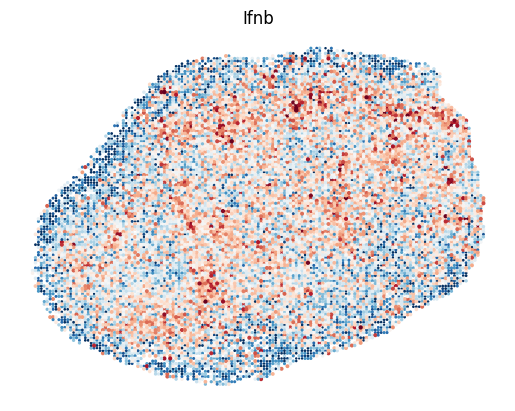

In [28]:
# plt.figure(figsize=(5, 4))
gene = 'Ifnb'
sns.scatterplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                # s=(fdata[:, gene].layers['counts'].toarray().flatten()) * 0.5, c=fdata[:, gene].layers['counts'].toarray().flatten(), alpha=1, legend=False,
                s=fdata[:, 'Spp1'].X.toarray().flatten() * 2, c=fdata[:, 'Spp1'].X.toarray().flatten(), alpha=1, legend=False,
                cmap='RdBu_r', edgecolor='none', vmax=4.7, vmin=2)
plt.gca().invert_yaxis()
plt.title(gene)
# plt.legend(title='Gzmb', loc='upper right', bbox_to_anchor=(1.1, 1), borderaxespad=0., frameon=False)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.show()

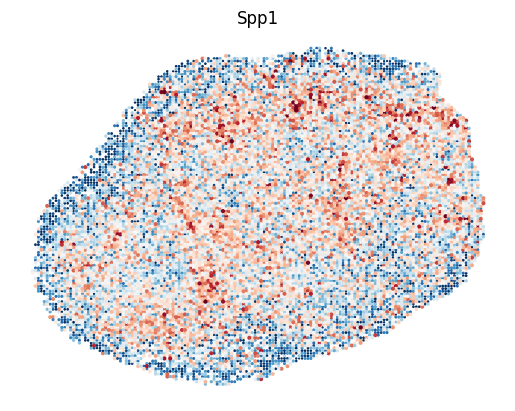

In [12]:
# plt.figure(figsize=(5, 4))
gene = 'Spp1'
sns.scatterplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                # s=(fdata[:, gene].layers['counts'].toarray().flatten()) * 0.5, c=fdata[:, gene].layers['counts'].toarray().flatten(), alpha=1, legend=False,
                s=fdata[:, 'Spp1'].X.toarray().flatten() * 2, c=fdata[:, 'Spp1'].X.toarray().flatten(), alpha=1, legend=False,
                cmap='RdBu_r', edgecolor='none', vmax=4.7, vmin=2)
plt.gca().invert_yaxis()
plt.title(gene)
# plt.legend(title='Gzmb', loc='upper right', bbox_to_anchor=(1.1, 1), borderaxespad=0., frameon=False)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.show()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/matplotlib/collections.py:996: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/matplotlib/collections.py:996: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/relational.py:456: RuntimeWarning: invalid value encountered in sqrt
  linewidth = .08 * np.sqrt(np.percentile(sizes, 10))


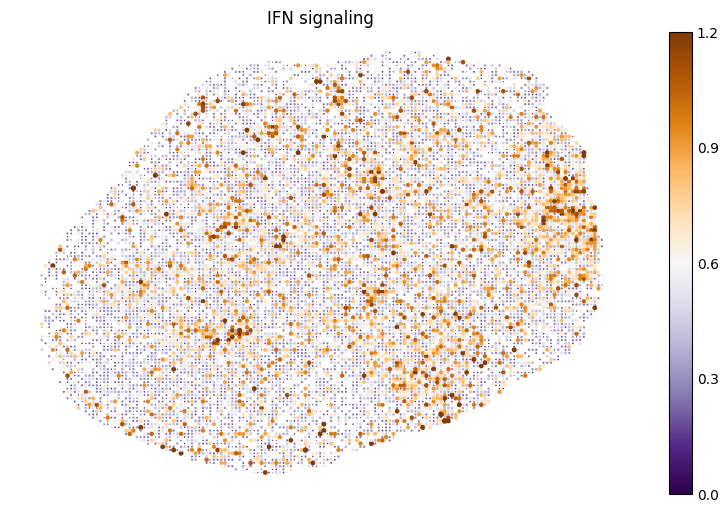

In [52]:
IFN_signaling = ['Adar', 'Arg1', 'Cactin', 'Cdc37', 'Cnot7', 'Dcst1', 'Dnaja3', 'Eif4e2', 'Fadd', 'Gigyf2', 'Hdac4', 'Hpx', 'Ifih1', 'Ifitm1', 'Ifitm2', 'Ifitm3', 'Ifitm6', 'Ifitm7', 'Ifna1', 'Ifnar1', 'Ifnar2', 'Ifnb1', 'Ifng', 'Ifngr1', 'Ifngr2', 'Igtp', 'Ikbke', 'Irak1', 'Irf1', 'Irf3', 'Irf7', 'Irgm1', 'Irgm2', 'Isg15', 'Jak1', 'Jak2', 'Lsm14a', 'Mavs', 'Med1', 'Mettl3', 'Mmp12', 'Mul1', 'Myd88', 'Nlrc5', 'Oas1a', 'Oas1b', 'Oas1c', 'Oas1d', 'Oas1e', 'Oas1f', 'Oas1g', 'Oas1h', 'Oas2', 'Oas3', 'Otop1', 'Parp14', 'Parp9', 'Pparg', 'Ptpn2', 'Rbm47', 'Rfpl4b', 'Rnf185', 'Samhd1', 'Sin3a', 'Smim30', 'Stat1', 'Stat2', 'Sting1', 'Tbk1', 'Trex1', 'Trim41', 'Trim56', 'Trim6', 'Trim65', 'Trp53', 'Ttll12', 'Txk', 'Tyk2', 'Ube2k', 'Usp27x', 'Usp29', 'Wnt5a', 'Ythdf2', 'Ythdf3', 'Zbp1']
IFN_signaling = np.intersect1d(IFN_signaling, degs)
plt.figure(figsize=(10, 6))
sc.tl.score_genes(fdata, gene_list=utils.gene_mouse(fdata, IFN_signaling), score_name='IFN_signaling')
scatter = sns.scatterplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                    s=fdata.obs['IFN_signaling'] * 10, c=fdata.obs['IFN_signaling'], alpha=1, legend=False,
                    cmap='PuOr_r', edgecolor='none',
                    vmax=1.2, vmin=0)
plt.gca().invert_yaxis()
plt.title('IFN signaling')
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
colorbar = plt.colorbar(scatter.collections[0])
colorbar.set_ticks([0, 0.3, 0.6, 0.9, 1.2])
colorbar.ax.tick_params(size=0)  # 去除colorbar的frame
sns.despine(left=True, bottom=True)
plt.show()

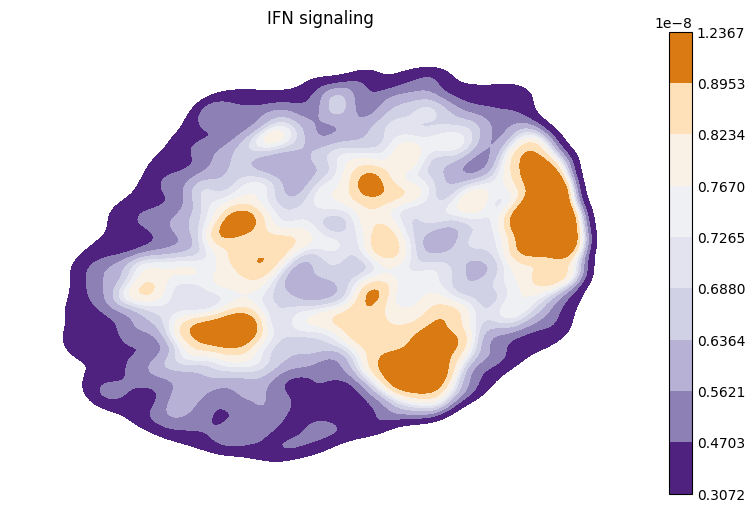

In [56]:
IFN_signaling = ['Adar', 'Arg1', 'Cactin', 'Cdc37', 'Cnot7', 'Dcst1', 'Dnaja3', 'Eif4e2', 'Fadd', 'Gigyf2', 'Hdac4', 'Hpx', 'Ifih1', 'Ifitm1', 'Ifitm2', 'Ifitm3', 'Ifitm6', 'Ifitm7', 'Ifna1', 'Ifnar1', 'Ifnar2', 'Ifnb1', 'Ifng', 'Ifngr1', 'Ifngr2', 'Igtp', 'Ikbke', 'Irak1', 'Irf1', 'Irf3', 'Irf7', 'Irgm1', 'Irgm2', 'Isg15', 'Jak1', 'Jak2', 'Lsm14a', 'Mavs', 'Med1', 'Mettl3', 'Mmp12', 'Mul1', 'Myd88', 'Nlrc5', 'Oas1a', 'Oas1b', 'Oas1c', 'Oas1d', 'Oas1e', 'Oas1f', 'Oas1g', 'Oas1h', 'Oas2', 'Oas3', 'Otop1', 'Parp14', 'Parp9', 'Pparg', 'Ptpn2', 'Rbm47', 'Rfpl4b', 'Rnf185', 'Samhd1', 'Sin3a', 'Smim30', 'Stat1', 'Stat2', 'Sting1', 'Tbk1', 'Trex1', 'Trim41', 'Trim56', 'Trim6', 'Trim65', 'Trp53', 'Ttll12', 'Txk', 'Tyk2', 'Ube2k', 'Usp27x', 'Usp29', 'Wnt5a', 'Ythdf2', 'Ythdf3', 'Zbp1']
IFN_signaling = np.intersect1d(IFN_signaling, degs)
plt.figure(figsize=(10, 6))
sc.tl.score_genes(fdata, gene_list=utils.gene_mouse(fdata, IFN_signaling), score_name='IFN_signaling')
fdata.obs['IFN_signaling'] = [c if c > 0 else 0 for c in fdata.obs['IFN_signaling']]
scatter = sns.kdeplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                    weights=fdata.obs['IFN_signaling'], alpha=1, legend=False,
                    cmap='PuOr_r', bw_adjust=0.5, fill=True)
plt.gca().invert_yaxis()
plt.title('IFN signaling')
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
colorbar = plt.colorbar(scatter.collections[0])
# colorbar.set_ticks([0, 0.3, 0.6, 0.9, 1.2])
colorbar.ax.tick_params(size=0)  # 去除colorbar的frame
sns.despine(left=True, bottom=True)
plt.show()

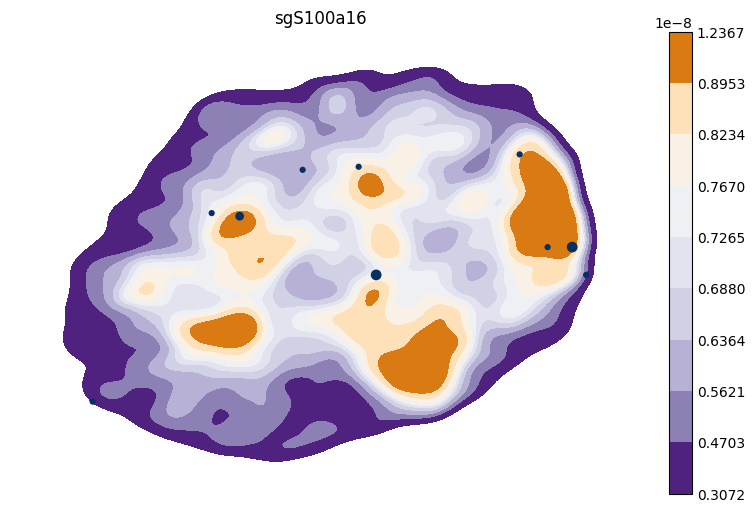

In [65]:
plt.figure(figsize=(10, 6))
scatter = sns.kdeplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                    weights=fdata.obs['IFN_signaling'], alpha=1, legend=False,
                    cmap='PuOr_r', bw_adjust=0.5, fill=True)
sns.scatterplot(x=gdata.obsm['spatial'][:, 0], y=gdata.obsm['spatial'][:, 1],
                s=gdata[:, 'sgS100a16'].X.toarray().flatten() * 20, c=gdata[:, 'sgS100a16'].X.toarray().flatten(), alpha=1, legend=False,
                cmap='RdBu_r', edgecolor='none', vmax=np.quantile(gdata[:, 'sgS100a16'].X.toarray().flatten(), 0.98), vmin=np.quantile(gdata[:, 'sgS100a16'].X.toarray().flatten(), 0.02))
plt.gca().invert_yaxis()
plt.title('sgS100a16')
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
colorbar = plt.colorbar(scatter.collections[0])
# colorbar.set_ticks([0, 0.3, 0.6, 0.9, 1.2])
colorbar.ax.tick_params(size=0)
sns.despine(left=True, bottom=True)
plt.show()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/relational.py:438: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'vmin', 'vmax' will be ignored
  points = ax.scatter(x=x, y=y, **kws)


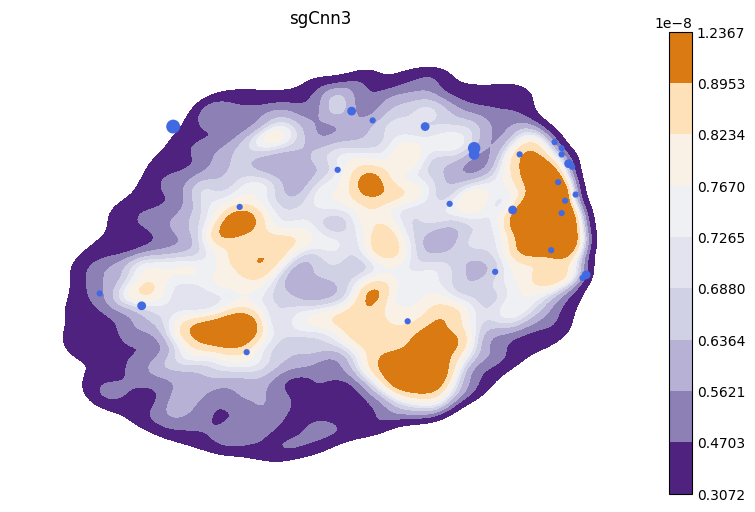

In [67]:
plt.figure(figsize=(10, 6))
scatter = sns.kdeplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                    weights=fdata.obs['IFN_signaling'], alpha=1, legend=False,
                    cmap='PuOr_r', bw_adjust=0.5, fill=True)

guide = 'sgCnn3'
sns.scatterplot(x=gdata.obsm['spatial'][:, 0], y=gdata.obsm['spatial'][:, 1],
                s=gdata[:, guide].X.toarray().flatten() * 20, color='royalblue', alpha=1, legend=False,
                edgecolor='none')
plt.gca().invert_yaxis()
plt.title(guide)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
colorbar = plt.colorbar(scatter.collections[0])
# colorbar.set_ticks([0, 0.3, 0.6, 0.9, 1.2])
colorbar.ax.tick_params(size=0)
sns.despine(left=True, bottom=True)
plt.show()

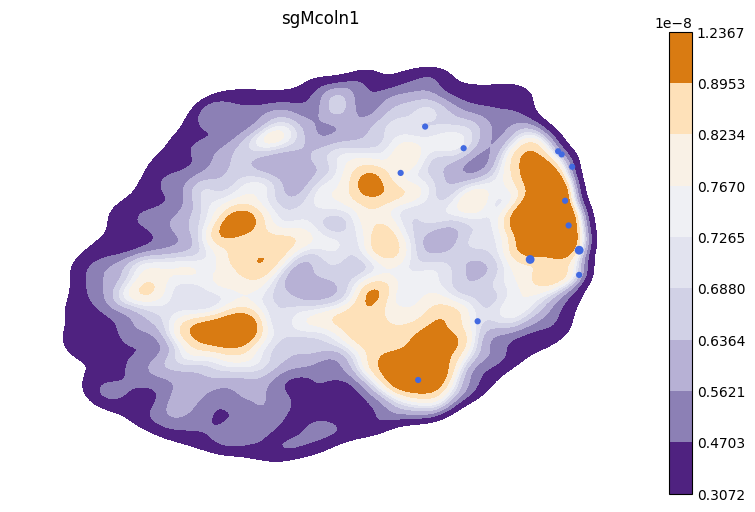

In [68]:
plt.figure(figsize=(10, 6))
scatter = sns.kdeplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                    weights=fdata.obs['IFN_signaling'], alpha=1, legend=False,
                    cmap='PuOr_r', bw_adjust=0.5, fill=True)

guide = 'sgMcoln1'
sns.scatterplot(x=gdata.obsm['spatial'][:, 0], y=gdata.obsm['spatial'][:, 1],
                s=gdata[:, guide].X.toarray().flatten() * 20, color='royalblue', alpha=1, legend=False,
                edgecolor='none')
plt.gca().invert_yaxis()
plt.title(guide)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
colorbar = plt.colorbar(scatter.collections[0])
# colorbar.set_ticks([0, 0.3, 0.6, 0.9, 1.2])
colorbar.ax.tick_params(size=0)
sns.despine(left=True, bottom=True)
plt.show()

In [71]:
gdata.var_names[gdata.var_names.str.startswith('sgNon')]

Index(['sgNon-targeting'], dtype='object')

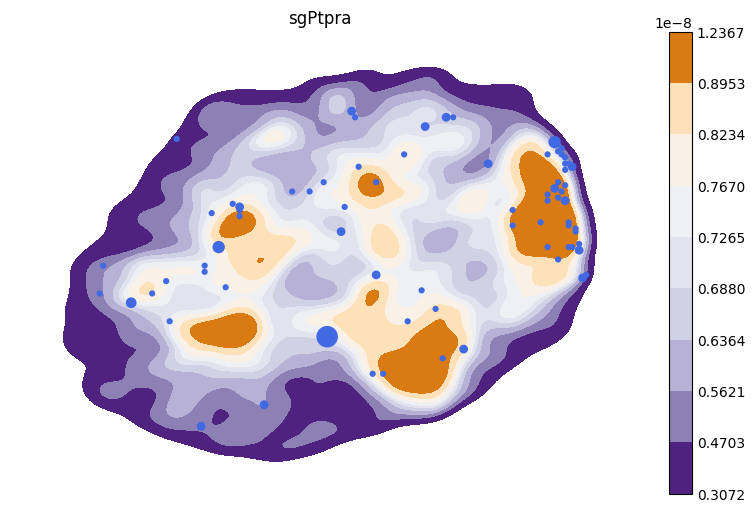

In [73]:
plt.figure(figsize=(10, 6))
scatter = sns.kdeplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                    weights=fdata.obs['IFN_signaling'], alpha=1, legend=False,
                    cmap='PuOr_r', bw_adjust=0.5, fill=True)

guide = 'sgPtpra'
sns.scatterplot(x=gdata.obsm['spatial'][:, 0], y=gdata.obsm['spatial'][:, 1],
                s=gdata[:, guide].X.toarray().flatten() * 20, color='royalblue', alpha=1, legend=False,
                edgecolor='none')
plt.gca().invert_yaxis()
plt.title(guide)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
colorbar = plt.colorbar(scatter.collections[0])
# colorbar.set_ticks([0, 0.3, 0.6, 0.9, 1.2])
colorbar.ax.tick_params(size=0)
sns.despine(left=True, bottom=True)
plt.show()

In [1]:
plt.figure(figsize=(10, 6))
scatter = sns.kdeplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                    weights=fdata.obs['IFN_signaling'], alpha=1, legend=False,
                    cmap='PuOr_r', bw_adjust=0.5, fill=True)

guide = 'sgSlc39a10'
sns.scatterplot(x=gdata.obsm['spatial'][:, 0], y=gdata.obsm['spatial'][:, 1],
                s=gdata[:, guide].X.toarray().flatten() * 20, color='royalblue', alpha=1, legend=False,
                edgecolor='none')
plt.gca().invert_yaxis()
plt.title(guide)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
colorbar = plt.colorbar(scatter.collections[0])
# colorbar.set_ticks([0, 0.3, 0.6, 0.9, 1.2])
colorbar.ax.tick_params(size=0)
sns.despine(left=True, bottom=True)
plt.show()

NameError: name 'plt' is not defined

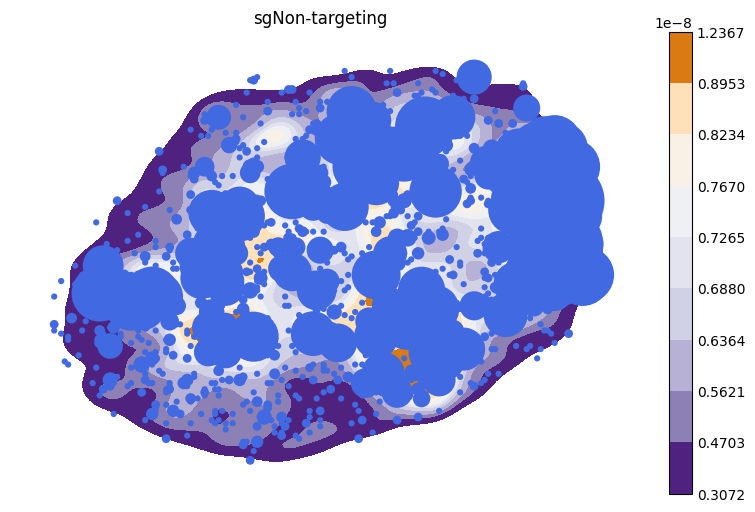

In [72]:
plt.figure(figsize=(10, 6))
scatter = sns.kdeplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                    weights=fdata.obs['IFN_signaling'], alpha=1, legend=False,
                    cmap='PuOr_r', bw_adjust=0.5, fill=True)

guide = 'sgNon-targeting'
sns.scatterplot(x=gdata.obsm['spatial'][:, 0], y=gdata.obsm['spatial'][:, 1],
                s=gdata[:, guide].X.toarray().flatten() * 20, color='royalblue', alpha=1, legend=False,
                edgecolor='none')
plt.gca().invert_yaxis()
plt.title(guide)
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
colorbar = plt.colorbar(scatter.collections[0])
# colorbar.set_ticks([0, 0.3, 0.6, 0.9, 1.2])
colorbar.ax.tick_params(size=0)
sns.despine(left=True, bottom=True)
plt.show()

In [ ]:
top_genes = ['']

In [14]:
TGFb_response = pd.read_csv('./progeny.csv')
TGFb_response = TGFb_response[TGFb_response['source'] == 'TGFb']
TGFb_response = TGFb_response.sort_values(by='p_value', ascending=True)
print(TGFb_response)
TGFb_response = TGFb_response.target.tolist()
deg_tgfb_genes = np.intersect1d(TGFb_response, degs)

      Unnamed: 0 source   target    weight       p_value
3740        3740   TGFb    Fstl3  6.807359  1.049378e-11
3741        3741   TGFb      Pln  2.748323  1.766237e-11
3742        3742   TGFb    Nuak1  6.095430  3.101081e-10
3743        3743   TGFb    Unc5b  3.833820  3.994424e-09
3744        3744   TGFb  Hsd17b6  4.782527  1.812801e-08
...          ...    ...      ...       ...           ...
4235        4235   TGFb     Gls2  0.116902  8.066444e-01
4236        4236   TGFb    Myrfl  0.084445  8.072342e-01
4237        4237   TGFb    Mars1 -0.284717  8.091648e-01
4238        4238   TGFb   Atp8b3  0.070479  8.109793e-01
4239        4239   TGFb  Fam241b -0.107275  8.112906e-01

[500 rows x 5 columns]


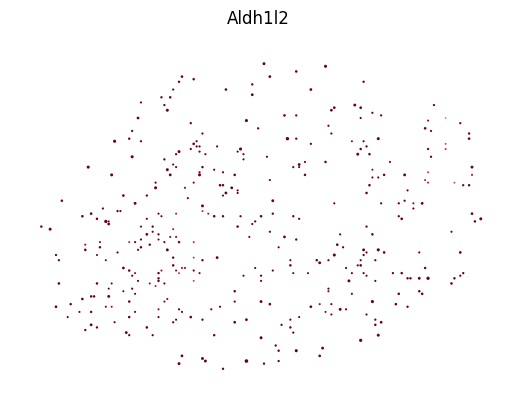

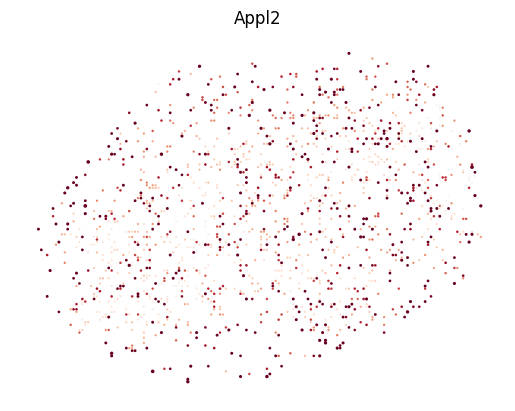

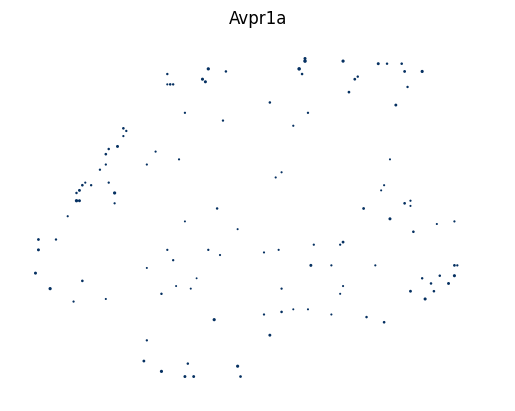

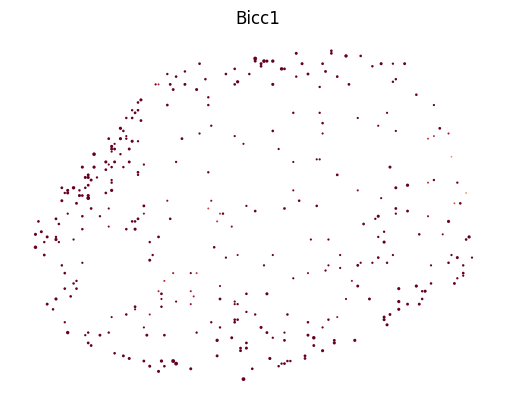

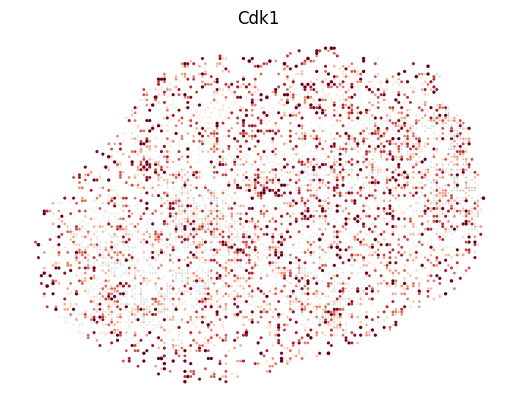

...

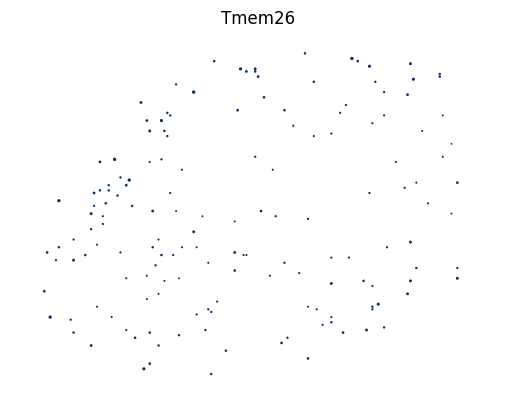

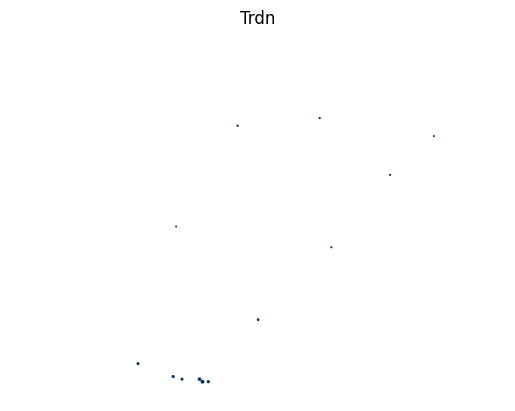

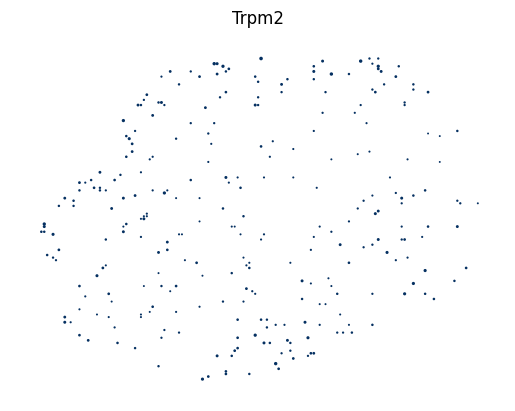

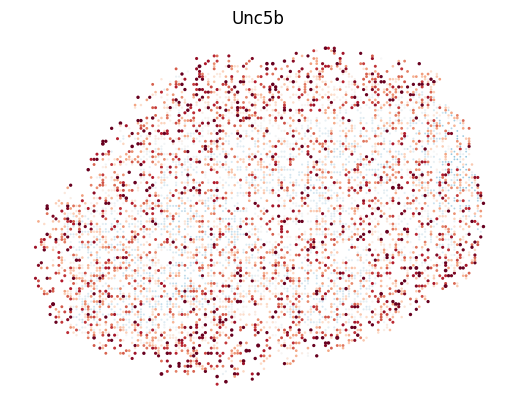

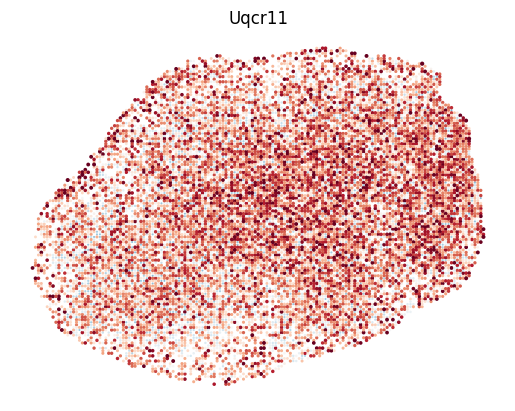

In [21]:
import squidpy as sq

for i in deg_tgfb_genes:
    sns.scatterplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                    s=fdata[:, i].X.toarray().flatten() * 2, c=fdata[:, i].X.toarray().flatten(), alpha=1, legend=False,
                    cmap='RdBu_r', edgecolor='none',
                    vmax=np.quantile(fdata[:, i].X.toarray().flatten(), 0.98), vmin=np.quantile(fdata[:, i].X.toarray().flatten(), 0.02))
    plt.gca().invert_yaxis()
    plt.title(i)
    plt.xlabel('')
    plt.ylabel('')
    plt.xticks([])
    plt.yticks([])
    sns.despine(left=True, bottom=True)
    plt.show()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/matplotlib/collections.py:996: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/matplotlib/collections.py:996: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/relational.py:456: RuntimeWarning: invalid value encountered in sqrt
  linewidth = .08 * np.sqrt(np.percentile(sizes, 10))


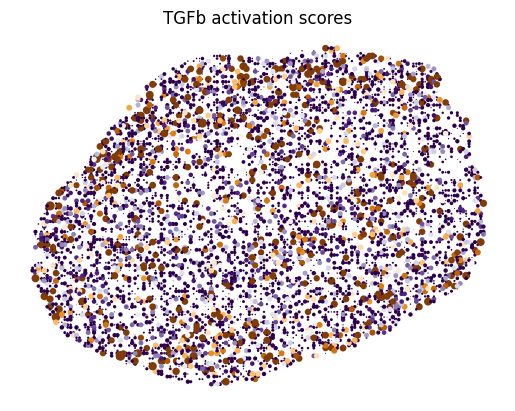

In [87]:
TGFb_response = np.intersect1d(TGFb_response, fdata.var_names)
sc.tl.score_genes(fdata, gene_list=utils.gene_mouse(fdata, TGFb_response), score_name='TGFb_response')
sns.scatterplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                s=fdata.obs['TGFb_response'] * 100, c=fdata.obs['TGFb_response'], alpha=1, legend=False,
                cmap='PuOr_r', edgecolor='none',
                vmax=np.quantile(fdata.obs['TGFb_response'], 0.98), vmin=np.quantile(fdata.obs['TGFb_response'], 0.9))
plt.gca().invert_yaxis()
plt.title('TGFb activation scores')
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.show()

In [13]:
INF_response = ["ADAR", "ARG1", "AZI2", "CACTIN", "CDC37", "CNOT7", "DCST1", "EIF4E2", "FADD", "GIGYF2", "HCK", "HDAC4", "HPX", "IFI27", "IFIH1", "IFITM1", "IFITM2", "IFITM3", "IFNA1", "IFNA10", "IFNA13", "IFNA14", "IFNA16", "IFNA17", "IFNA2", "IFNA21", "IFNA4", "IFNA5", "IFNA6", "IFNA7", "IFNA8", "IFNAR1", "IFNAR2", "IFNB1", "IFNE", "IFNG", "IFNGR1", "IFNGR2", "IFNK", "IFNL1", "IFNL2", "IFNL3", "IFNL4", "IFNLR1", "IFNW1", "IKBKE", "IL10RB", "IRAK1", "IRF1", "IRF3", "IRF7", "IRGM", "ISG15", "JAK1", "JAK2", "LSM14A", "MAVS", "MED1", "METTL3", "MIR21", "MMP12", "MUL1", "MYD88", "NLRC5", "NR1H2", "NR1H3", "OAS1", "OAS2", "OAS3", "OTOP1", "PARP14", "PARP9", "PPARG", "PTPN1", "PTPN11", "PTPN2", "PTPN6", "RAF1", "RBM47", "RNF185", "SAMHD1", "SIN3A", "SMIM30", "SP100", "STAT1", "STAT2", "STING1", "TANK", "TBK1", "TBKBP1", "TP53", "TRAF3", "TREX1", "TRIM41", "TRIM56", "TRIM6", "TRIM65", "TTLL12", "TXK", "TYK2", "UBE2K", "USP18", "USP27X", "USP29", "WNT5A", "YTHDF2", "YTHDF3", "ZBP1"]

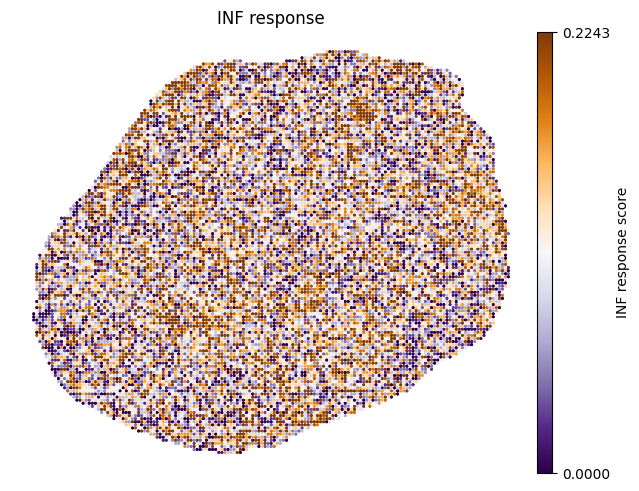

In [19]:
import squidpy as sq

sc.tl.score_genes(fdata, gene_list=utils.gene_mouse(fdata, INF_response), score_name='INF_response')
ax = sq.pl.spatial_scatter(fdata, color='INF_response', size=5,
                      title='INF response', shape=None, library_id='spatial',
                      vmax=np.quantile(fdata.obs['INF_response'], 0.9), vmin=0, return_ax=True, cmap='PuOr_r')
ax.set_xlabel('')
ax.set_ylabel('')
ax.collections[0].colorbar.set_label('INF response score')
ax.collections[0].colorbar.set_ticks([0, np.quantile(fdata.obs['INF_response'], 0.9)])
# ax.collections[0].colorbar.frame.set_linewidth(0)
sns.despine(left=True, bottom=True)
# plt.savefig('./plots/IFN_pathway.pdf', format='pdf', bbox_inches='tight')
plt.show()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/matplotlib/collections.py:996: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/matplotlib/collections.py:996: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


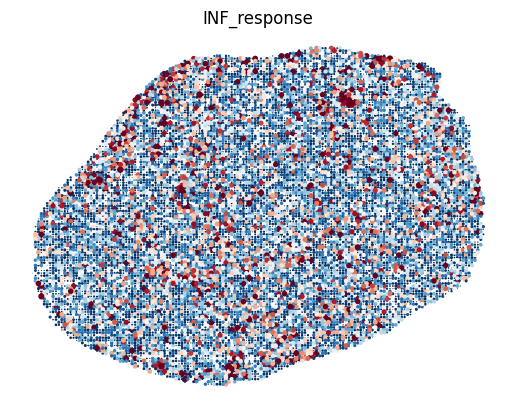

In [27]:
sns.scatterplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                s=fdata.obs['INF_response'] * 50, c=fdata.obs['INF_response'], alpha=1, legend=False,
                cmap='RdBu_r', edgecolor='none',
                vmax=np.quantile(fdata.obs['INF_response'], 0.98), vmin=np.quantile(fdata.obs['INF_response'], 0.4))
plt.gca().invert_yaxis()
plt.title('INF_response')
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.show()

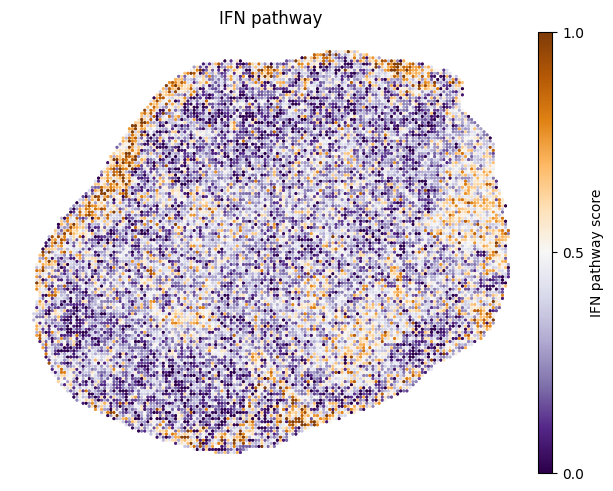

In [102]:
import squidpy as sq

IFN_pathway = ['Ifitm3', 'Isg20', 'Ifitm1', 'Ifitm2', 'Gapdh', 'Hck', 'Vcam1', 'Ccl8', 'Irf4', 'Camk2a', 'Ptafr', 'Sirpa', 'Mefv', 'Ubd', 'Cd74']
sc.tl.score_genes(fdata, gene_list=IFN_pathway, score_name='IFN_pathway')
ax = sq.pl.spatial_scatter(fdata, color='IFN_pathway', size=5,
                      title='IFN pathway', shape=None, library_id='spatial',
                      vmax=1, vmin=0, return_ax=True, cmap='PuOr_r')
ax.set_xlabel('')
ax.set_ylabel('')
ax.collections[0].colorbar.set_label('IFN pathway score')
ax.collections[0].colorbar.set_ticks([0, 0.5, 1])
# ax.collections[0].colorbar.frame.set_linewidth(0)
sns.despine(left=True, bottom=True)
# plt.savefig('./plots/IFN_pathway.pdf', format='pdf', bbox_inches='tight')
plt.show()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/matplotlib/collections.py:996: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/matplotlib/collections.py:996: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


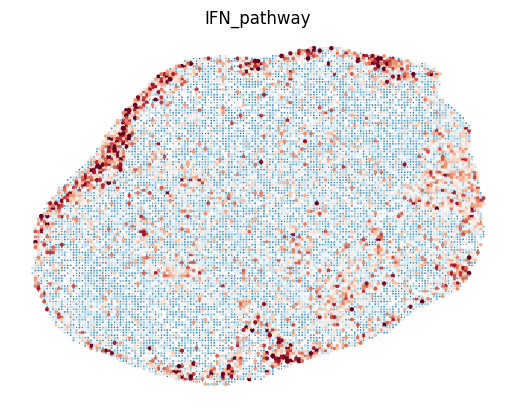

In [106]:
sns.scatterplot(x=fdata.obsm['spatial'][:, 0], y=fdata.obsm['spatial'][:, 1],
                s=fdata.obs['IFN_pathway'] * 10, c=fdata.obs['IFN_pathway'], alpha=1, legend=False,
                cmap='RdBu_r', edgecolor='none', vmax=1, vmin=0)
plt.gca().invert_yaxis()
plt.title('IFN_pathway')
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.show()